# Linear Regression Model to Predict Average Sales for Every Store Based on Average Sales of Each Product Family in the Last 7 Days

### Importing the Libraries and Creating the Dataframe

In [1]:
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

train1 = pd.read_csv('train_1.csv', sep=',', header=0)
train2 = pd.read_csv('train_2.csv', sep=',', header=0)
train3 = pd.read_csv('train_3.csv', sep=',', header=0)
train4 = pd.read_csv('train_4.csv', sep=',', header=0)
train = pd.concat([train1, train2, train3, train4], ignore_index=True)
train = train[train['store_nbr'] == 1]
oil = pd.read_csv('oil.csv', sep=',', header=0)
all_train = pd.concat([train1, train2, train3, train4], ignore_index=True)

### Reading in the Data CSV

In [2]:
data = pd.read_csv('test_out.csv', sep=',', header=0)

### Function to Make a Dataframe of Average Sales for a Store

In [3]:
def make_store_df(store_data, store_nbr):
    new_train = store_data[store_data['store_nbr'] == store_nbr]
    new_train = new_train.drop(columns=['id','store_nbr'], axis=1)
    train_data = new_train.pivot_table(index=['date'], columns="family", values='sales')
    train_data["Average_sales"] = train_data[list(train_data.columns[1:])].mean(axis=1)
    return train_data

### Making a Dataframe for Every Store

In [4]:
all_stores = []

for i in range(1,55):
    store = make_store_df(all_train, i)
    all_stores.append(store)
all_stores[1]

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD,Average_sales
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.000,...,0.000,0.0,0.0,0.0,0.00000,0.000000,0.0000,0.0,0.000000,0.000000
2013-01-02,8.0,0.0,3.0,1481.0,0.0,523.882,0.0,1432.0,651.0,303.875,...,655.626,333.0,0.0,0.0,342.50598,127.357000,0.0000,0.0,31.373001,320.584968
2013-01-03,5.0,0.0,2.0,1016.0,0.0,321.693,0.0,1398.0,461.0,177.799,...,597.745,236.0,0.0,0.0,317.65200,92.043000,0.0000,0.0,34.343000,237.735625
2013-01-04,3.0,0.0,3.0,1146.0,0.0,299.012,0.0,958.0,480.0,231.374,...,689.216,188.0,0.0,0.0,305.01900,78.303000,0.0000,0.0,49.833000,235.105531
2013-01-05,5.0,0.0,9.0,1581.0,0.0,385.333,0.0,1284.0,620.0,247.811,...,578.157,245.0,0.0,0.0,383.70000,82.112000,0.0000,0.0,43.962000,297.955187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,14.0,0.0,8.0,2390.0,0.0,601.000,11.0,678.0,790.0,212.375,...,977.961,353.0,18.0,5.0,533.77400,128.282000,2028.7040,0.0,25.675001,408.367844
2017-08-12,7.0,0.0,7.0,2649.0,0.0,637.000,12.0,659.0,734.0,251.246,...,304.844,225.0,9.0,8.0,359.52200,130.451000,2159.9400,0.0,26.413000,386.731750
2017-08-13,9.0,0.0,10.0,2947.0,0.0,642.000,16.0,752.0,892.0,192.428,...,315.441,277.0,6.0,11.0,470.48700,101.716995,2476.7031,0.0,44.046000,429.931940


### Making a Time Series of Scaled Data for the Last 7 Days of Sales for A Store

In [5]:
def transform_data_all_stores(train_data):
    split = int(len(train_data)*0.6)
    val = int(len(train_data)*0.2) + split
    
    train_x = train_data.iloc[:split , 1:-1]

    train_y = train_data.iloc[:split, -1]
    train_y = np.array(train_y).reshape(-1,1)

    sc = MinMaxScaler(feature_range=(0,1))

    train_scaled_x = sc.fit_transform(train_x)
    train_scaled_y  = sc.fit_transform(train_y)

    train_x_l = []
    train_y_l = []

    for i in range(7, split):
        train_x_l.append(train_scaled_x[i-7:i])
        train_y_l.append(train_scaled_y[i][0])

    val_x = train_data.iloc[split:val, 1:-1]

    val_y = train_data.iloc[split:val, -1]
    val_y = np.array(val_y).reshape(-1,1)

    val_scaled_x = sc.fit_transform(val_x)
    val_scaled_y = sc.fit_transform(val_y)

    val_x_l, val_y_l = [], []

    for i in range(7, len(val_scaled_x)):
        val_x_l.append(val_scaled_x[i-7:i])
        val_y_l.append(val_scaled_y[i][0])

    return np.asarray(train_x_l), np.asarray(train_y_l), np.asarray(val_x_l), np.asarray(val_y_l)


### Same as Above but for Testing Data

In [6]:
def test_all_stores(test_data, model):
    split = int(len(test_data)*0.6)
    val = int(len(test_data)*0.2) + split

    test_x = test_data.iloc[val:, 1:-1]
    
    test_y = test_data.iloc[val:, -1]
    test_y = np.array(test_y).reshape(-1,1)

    sc = MinMaxScaler(feature_range=(0,1))

    test_scaled = sc.fit_transform(test_x)
    test_scaled_y = sc.fit_transform(test_y)

    test_x_l = []
    test_y_l = []

    for i in range(7, len(test_scaled_y)):
        test_x_l.append(test_scaled[i-7:i])
        test_y_l.append(test_scaled_y[i][0])

    test_x_l = np.array(test_x_l)
    test_y_l = np.array(test_y_l)

    pred = model.predict(test_x_l)
    pred = pred[:, -1]
    pred = sc.inverse_transform(pred)

    return np.asarray(test_x_l), sc.inverse_transform(np.asarray(test_y_l).reshape(-1,1)), np.asarray(pred).reshape(-1,1), np.asarray(test_y_l)

### Training the Model Linear Regression

In [7]:
def train_model(train_x, train_y, val_x, val_y, num_lstm_units, num_epochs, batch_size):
    model = Sequential()
    
    model.add(Dense(units=1, activation='relu'))

    loss_fn = tf.keras.losses.MeanSquaredLogarithmicError()
    model.compile(optimizer='adam', loss=loss_fn)

    hist = model.fit(train_x, train_y, epochs=num_epochs, batch_size=batch_size, validation_data=(val_x, val_y))

    return model, hist

### Fitting and then Testing a Model per Store

In [8]:
train_all = []
test_all = []
model_all = []
history = []

for i, j in enumerate(all_stores):
    print('Store: ', i+1)
    train_x, train_y, val_x, val_y = transform_data_all_stores(j)
    model, hist = train_model(train_x, train_y, val_x, val_y, 50, 25, 100)
    test_x, test_y, pred, test_y_unscaled = test_all_stores(j, model)

    train_all.append((train_x, train_y))
    test_all.append((test_y, pred))
    model_all.append(model)
    history.append(hist)

Store:  1
Epoch 1/25
11/11 [==============================] - 1s 13ms/step - loss: 0.0489 - val_loss: 0.0642
Epoch 2/25
11/11 [==============================] - 0s 3ms/step - loss: 0.0375 - val_loss: 0.0461
Epoch 3/25
11/11 [==============================] - 0s 2ms/step - loss: 0.0322 - val_loss: 0.0364
Epoch 4/25
11/11 [==============================] - 0s 2ms/step - loss: 0.0309 - val_loss: 0.0332
Epoch 5/25
11/11 [==============================] - 0s 3ms/step - loss: 0.0305 - val_loss: 0.0331
Epoch 6/25
11/11 [==============================] - 0s 2ms/step - loss: 0.0301 - val_loss: 0.0334
Epoch 7/25
11/11 [==============================] - 0s 3ms/step - loss: 0.0296 - val_loss: 0.0332
Epoch 8/25
11/11 [==============================] - 0s 3ms/step - loss: 0.0295 - val_loss: 0.0326
Epoch 9/25
11/11 [==============================] - 0s 3ms/step - loss: 0.0291 - val_loss: 0.0310
Epoch 10/25
11/11 [==============================] - 0s 2ms/step - loss: 0.0288 - val_loss: 0.0317
Epoch 11

### Plotting the Training vs Validation Loss for Every Store

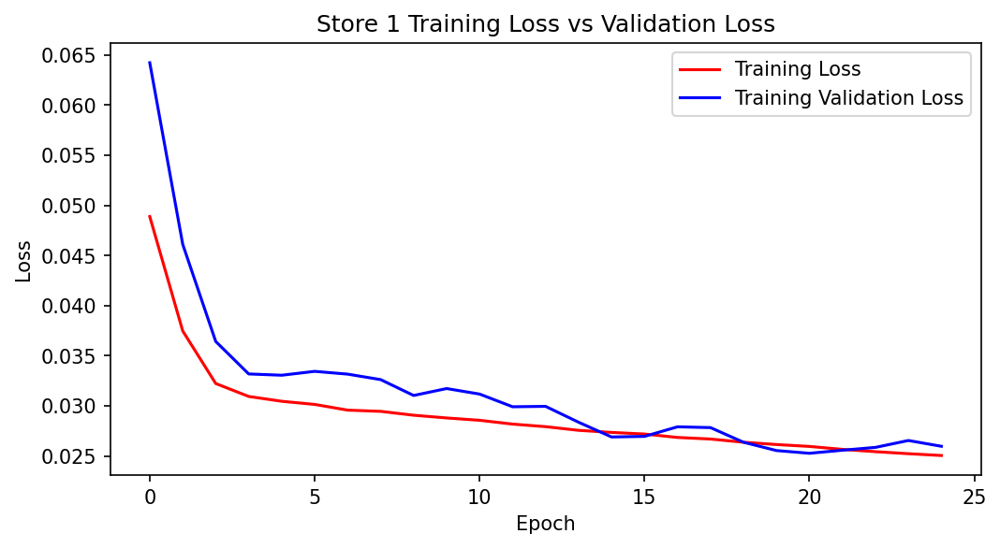

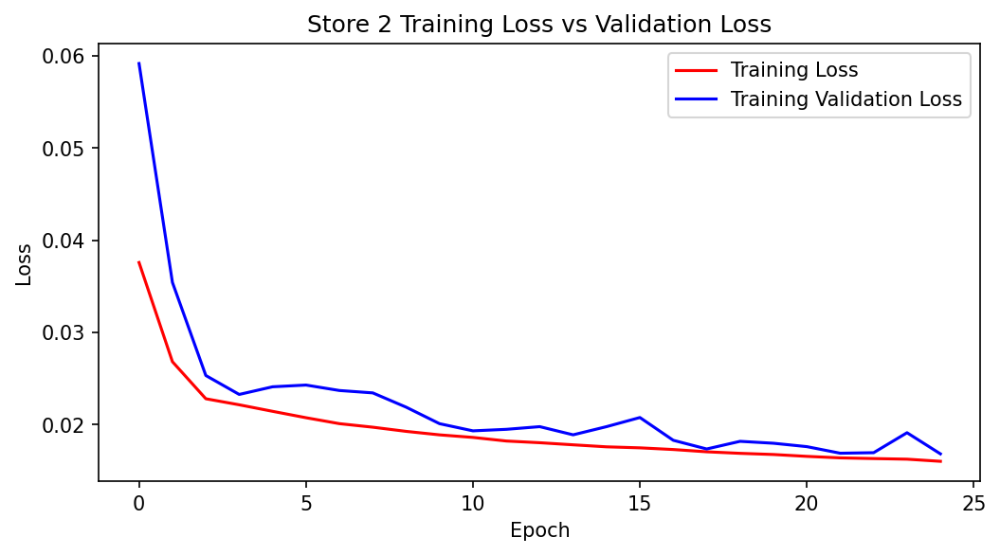

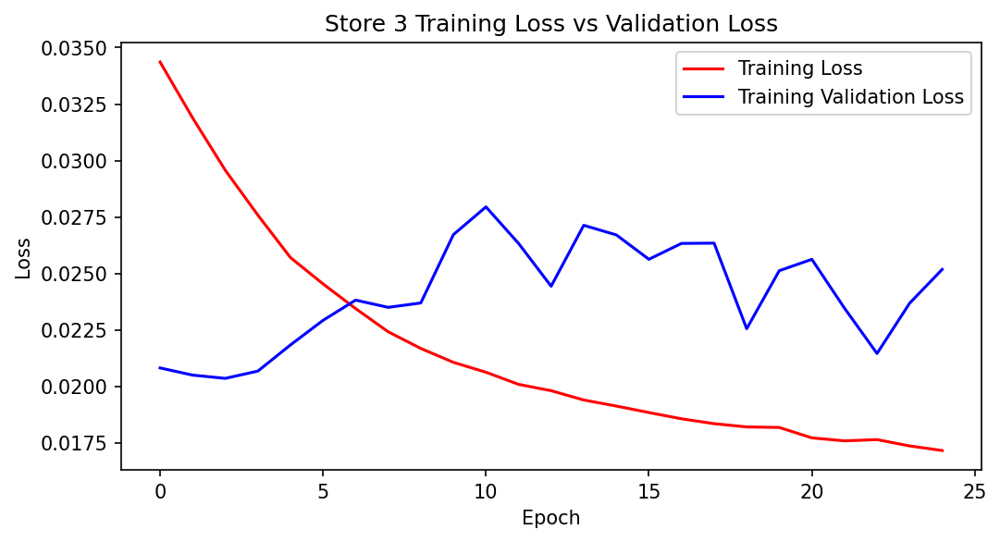

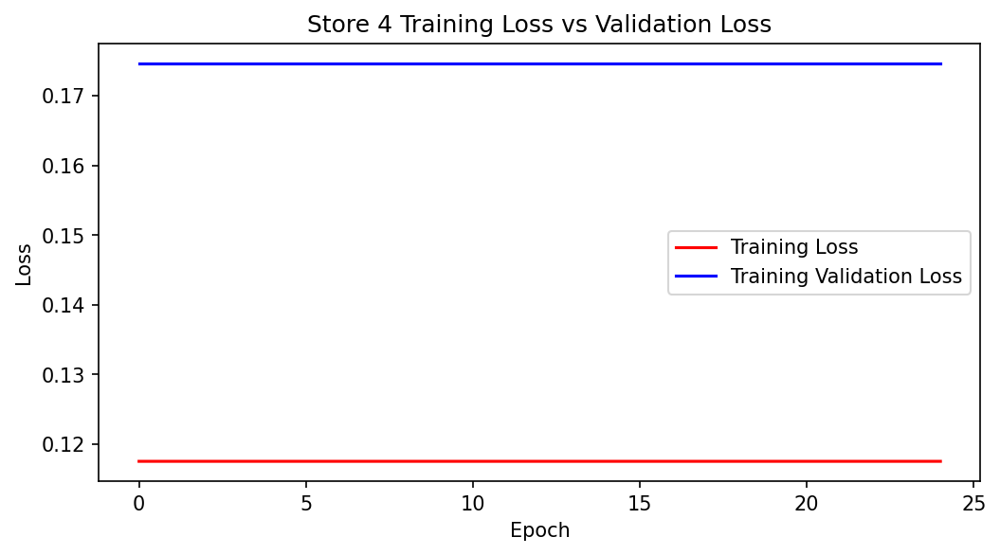

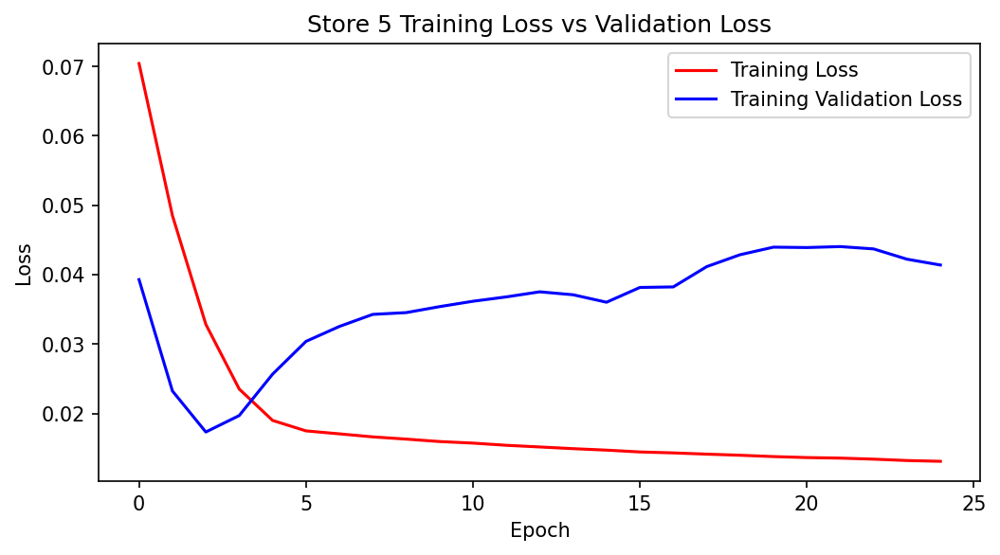

...

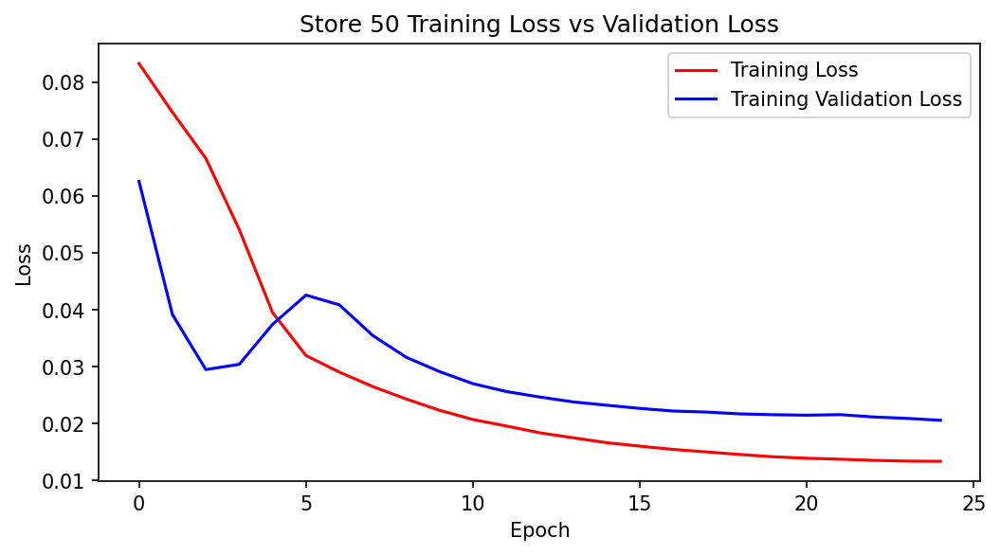

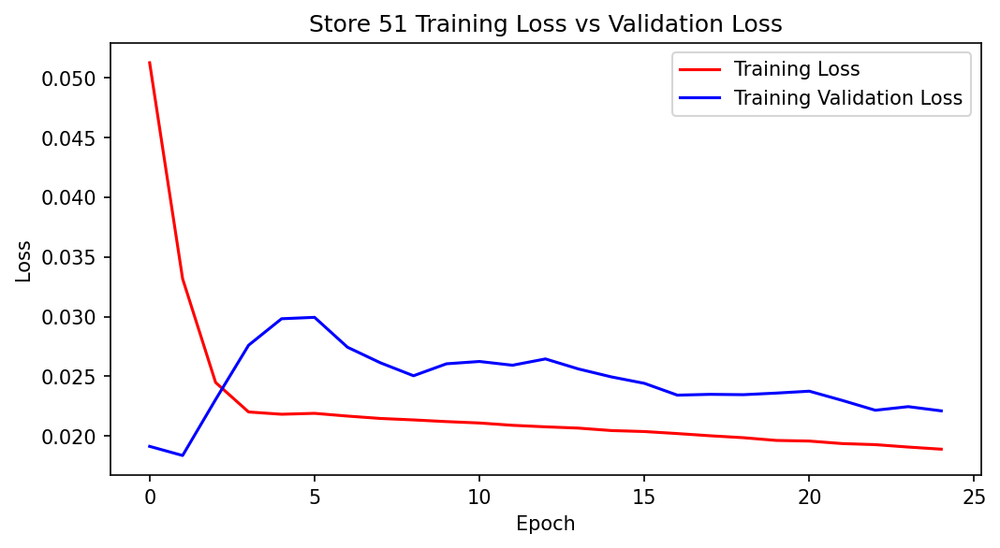

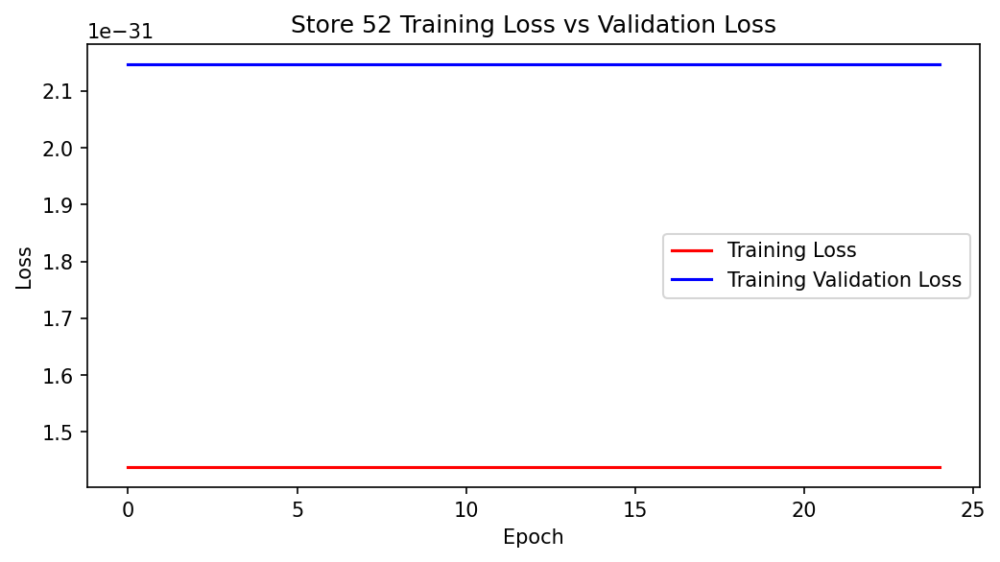

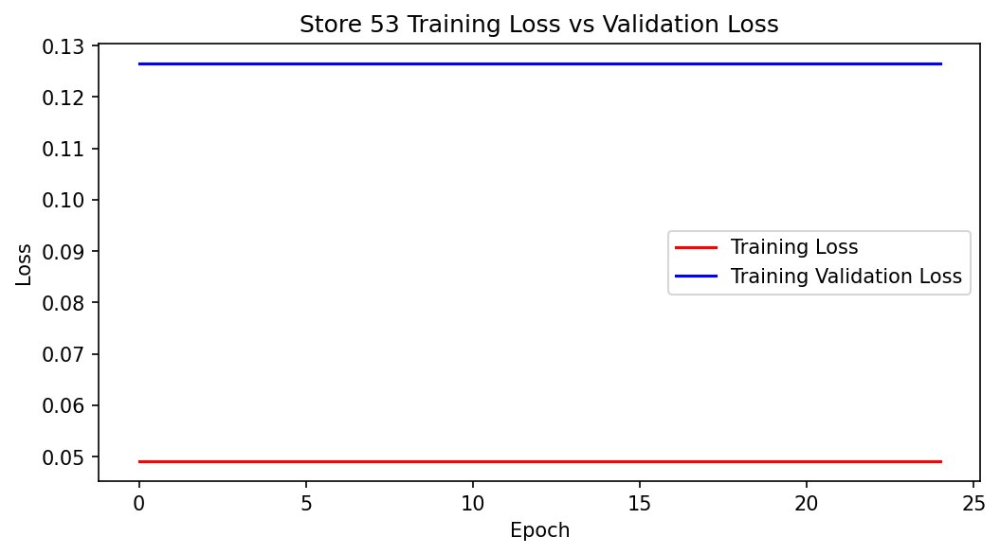

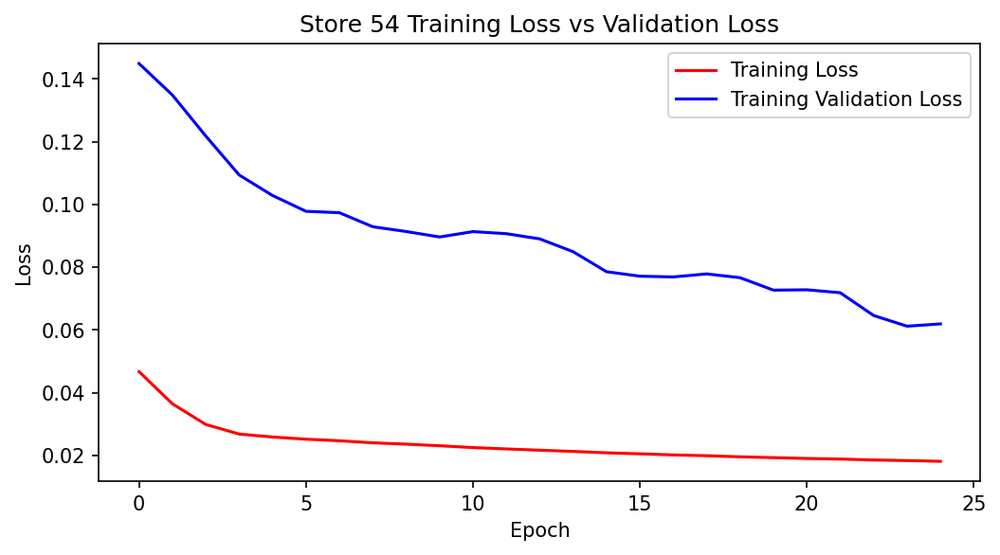

In [9]:
for i, j in enumerate(history):
    plt.figure(figsize=(8,4), dpi=150)
    plt.plot(j.history['loss'], color='red', label='Training Loss')
    plt.plot(j.history['val_loss'], color='blue', label='Training Validation Loss')
    plt.title('Store ' + str(i+1) + ' Training Loss vs Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

### Plotting the Average Sales for Every Store

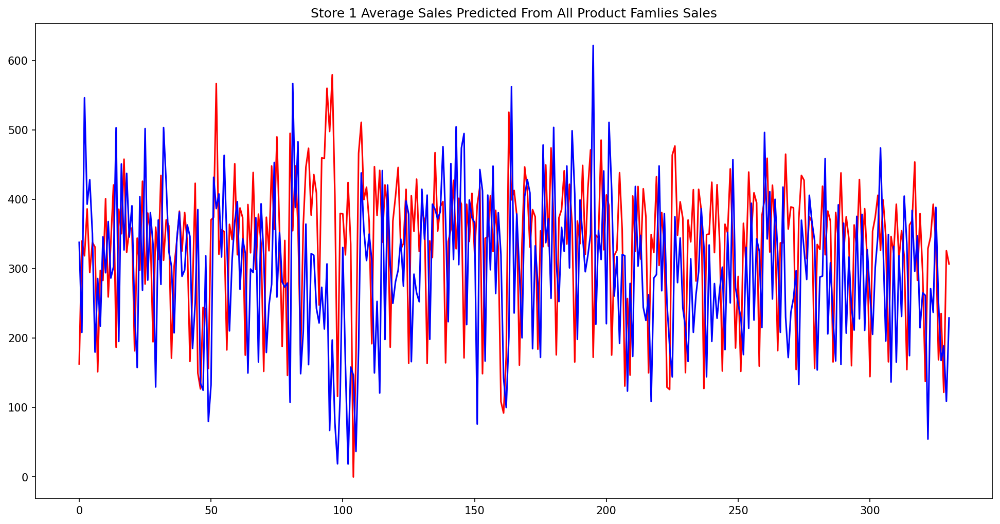

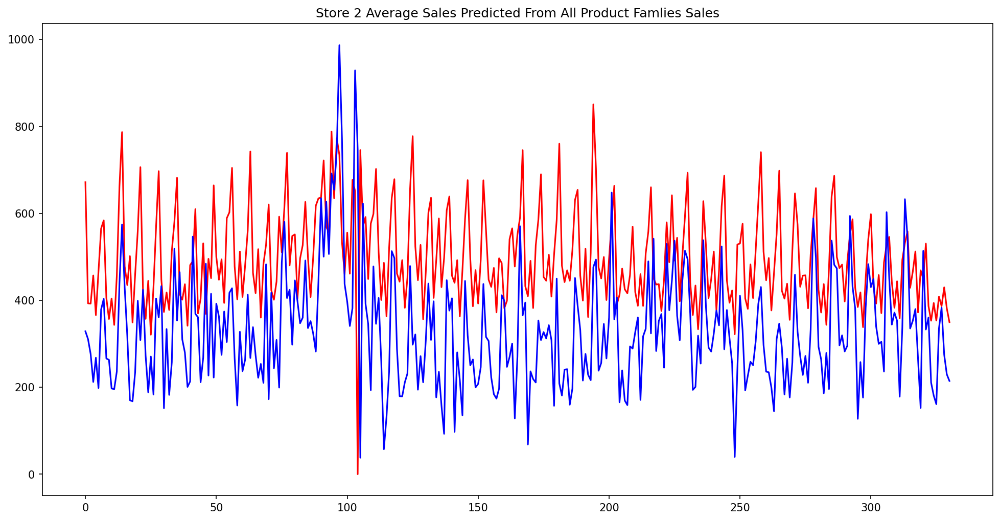

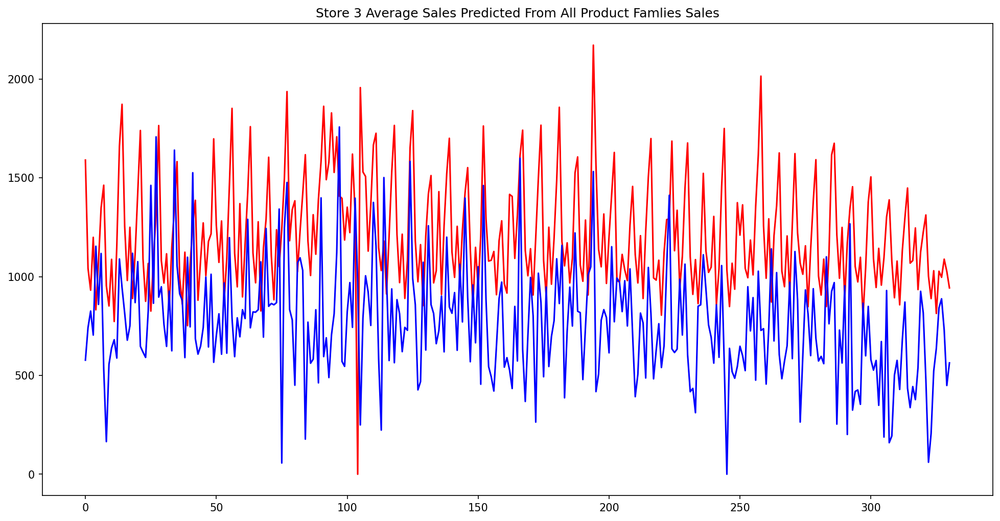

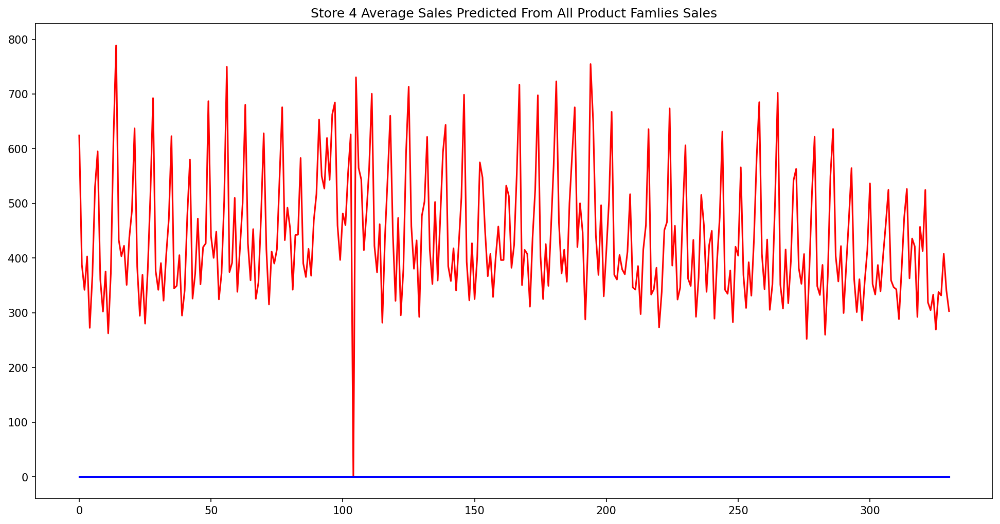

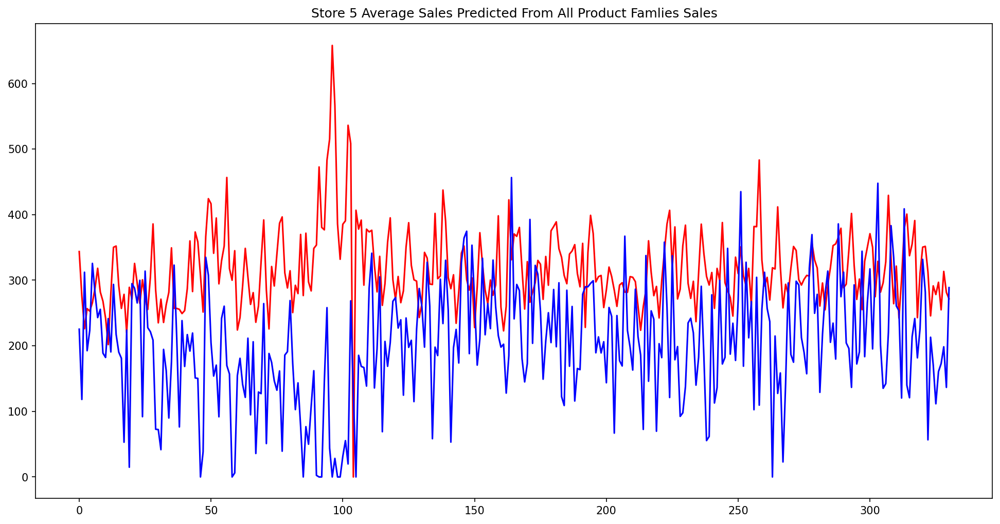

...

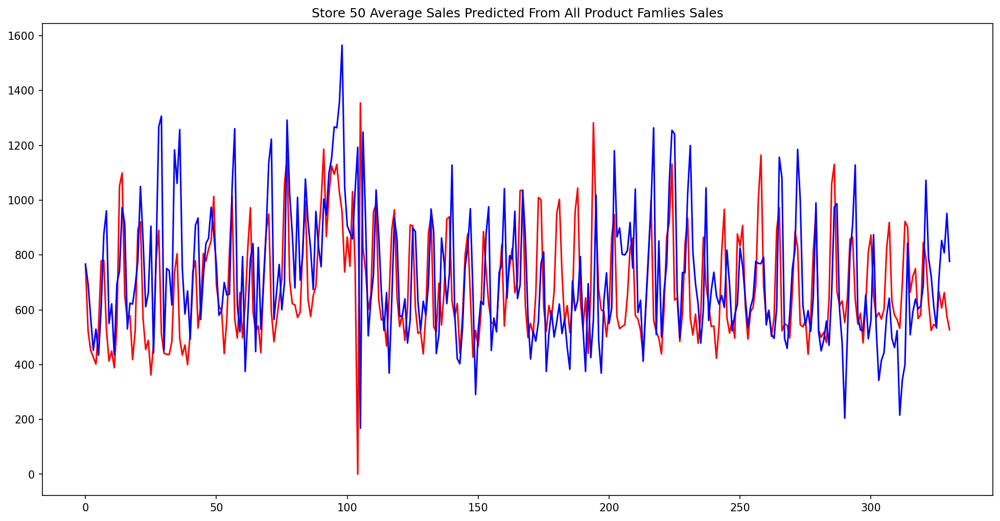

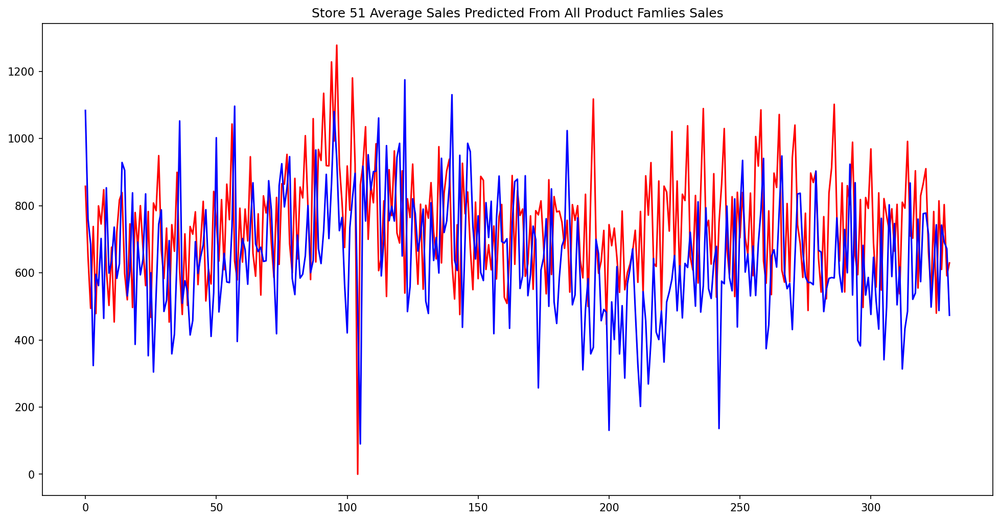

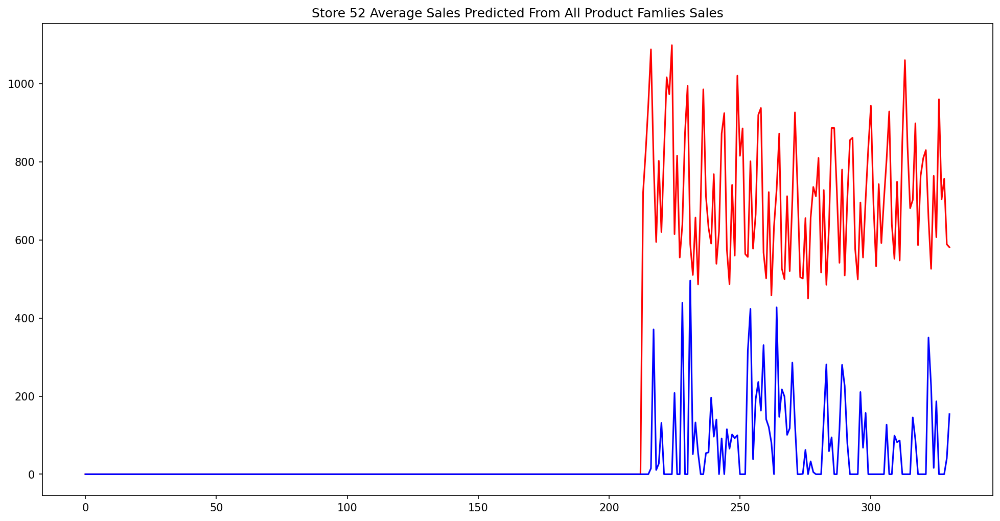

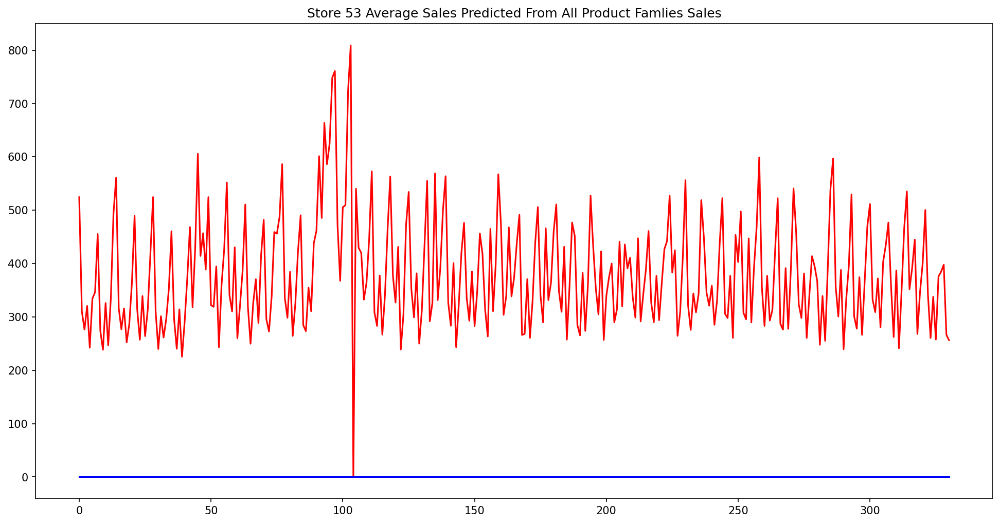

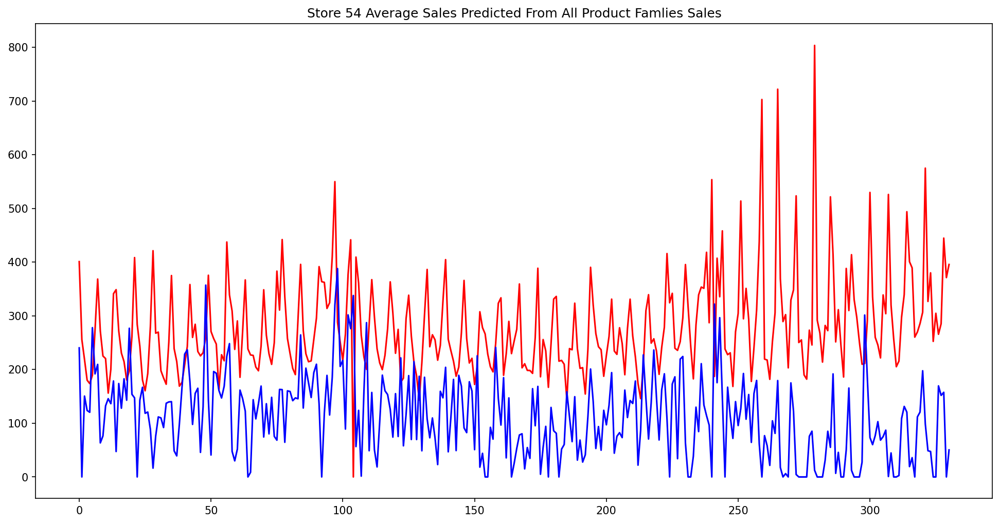

In [10]:
for i, j in enumerate(test_all):
    plt.figure(figsize=(16,8), dpi=150)
    plt.plot(j[0], color='red', label='Real Values')
    plt.plot(j[1], color='blue', label='Predicted Values')
    plt.title('Store ' + str(i+1) + ' Average Sales Predicted From All Product Famlies Sales')
    plt.show()

### Outputting the Final Training and Validation Loss for Every Store

In [11]:
for i, j in enumerate(history):
    print(i+1, ':', round(j.history['loss'][-1], 5), ',', round(j.history['val_loss'][-1], 5))

1 : 0.02505 , 0.02597
2 : 0.01603 , 0.01683
3 : 0.01717 , 0.02518
4 : 0.11755 , 0.17459
5 : 0.01312 , 0.04139
6 : 0.11393 , 0.15916
7 : 0.01825 , 0.0181
8 : 0.01772 , 0.02642
9 : 0.0135 , 0.03517
10 : 0.01836 , 0.02107
11 : 0.01778 , 0.01662
12 : 0.01257 , 0.0526
13 : 0.01315 , 0.02
14 : 0.0217 , 0.03445
15 : 0.00949 , 0.01517
16 : 0.01699 , 0.03953
17 : 0.01647 , 0.02183
18 : 0.01555 , 0.02855
19 : 0.0182 , 0.02877
20 : 0.02403 , 0.01455
21 : 0.01078 , 0.11922
22 : 0.00048 , 0.01645
23 : 0.01663 , 0.01327
24 : 0.02582 , 0.02357
25 : 0.00975 , 0.02519
26 : 0.00346 , 0.00664
27 : 0.02139 , 0.01638
28 : 0.01855 , 0.01477
29 : 0.03148 , 0.09386
30 : 0.02017 , 0.03124
31 : 0.00703 , 0.06228
32 : 0.00941 , 0.0128
33 : 0.01491 , 0.03081
34 : 0.01302 , 0.05667
35 : 0.00333 , 0.00702
36 : 0.0221 , 0.01269
37 : 0.01921 , 0.01418
38 : 0.01798 , 0.02244
39 : 0.01908 , 0.03618
40 : 0.01951 , 0.01448
41 : 0.01456 , 0.0771
42 : 0.01065 , 0.17351
43 : 0.01492 , 0.01739
44 : 0.01945 , 0.01775
45 : 0.0

In [12]:
rmsle = []
for i, j in enumerate(history):
    print(i+1, 'RMSLE:', round(j.history['loss'][-1]**0.5, 5), ',', round(j.history['loss'][-1], 5))

1 RMSLE: 0.15828 , 0.02505
2 RMSLE: 0.12659 , 0.01603
3 RMSLE: 0.13102 , 0.01717
4 RMSLE: 0.34286 , 0.11755
5 RMSLE: 0.11455 , 0.01312
6 RMSLE: 0.33753 , 0.11393
7 RMSLE: 0.13508 , 0.01825
8 RMSLE: 0.13313 , 0.01772
9 RMSLE: 0.11621 , 0.0135
10 RMSLE: 0.13551 , 0.01836
11 RMSLE: 0.13333 , 0.01778
12 RMSLE: 0.11212 , 0.01257
13 RMSLE: 0.11469 , 0.01315
14 RMSLE: 0.1473 , 0.0217
15 RMSLE: 0.09744 , 0.00949
16 RMSLE: 0.13035 , 0.01699
17 RMSLE: 0.12835 , 0.01647
18 RMSLE: 0.12469 , 0.01555
19 RMSLE: 0.13491 , 0.0182
20 RMSLE: 0.15503 , 0.02403
21 RMSLE: 0.10382 , 0.01078
22 RMSLE: 0.02189 , 0.00048
23 RMSLE: 0.12894 , 0.01663
24 RMSLE: 0.16068 , 0.02582
25 RMSLE: 0.09873 , 0.00975
26 RMSLE: 0.0588 , 0.00346
27 RMSLE: 0.14627 , 0.02139
28 RMSLE: 0.13618 , 0.01855
29 RMSLE: 0.17741 , 0.03148
30 RMSLE: 0.14204 , 0.02017
31 RMSLE: 0.08384 , 0.00703
32 RMSLE: 0.09699 , 0.00941
33 RMSLE: 0.12212 , 0.01491
34 RMSLE: 0.11409 , 0.01302
35 RMSLE: 0.05774 , 0.00333
36 RMSLE: 0.14867 , 0.0221
37 RMSL